# Models evaluation for traffic light detection

In [3]:
import tensorflow as tf
if tf.__version__ != '1.4.0':
  raise ImportError('Please upgrade your tensorflow installation to v1.4.0!')
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from PIL import ImageDraw
from PIL import ImageColor
import time
from scipy.stats import norm
import os
import urllib
import tarfile
import glob

import sys
sys.path.append('/home/alexb/tensorflow/models/research/object_detection/')
sys.path.append('/home/alexb/tensorflow/models/research')
from utils import label_map_util
from utils import visualization_utils as vis_util

%matplotlib inline
plt.style.use('ggplot')

## Prepare models
We'll use pretrained models from the [model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md).

In [4]:
def prepare_models(model_dir, model_names, model_date):
    if not os.path.exists(model_dir):
        os.makedirs(model_dir)
    model_directories = os.listdir(model_dir)

    for model_name in model_names:
        if model_name + '_' + model_date not in model_directories:
            model_file = model_name + '_' + model_date + '.tar.gz'
            deployed_model = os.path.join(model_dir, model_file)
            try:
                deployed_model, _ = urllib.request.urlretrieve(DOWNLOAD_BASE + model_file)
                print("\tdownloading", model_file)
            except:
                continue
            tar_file = tarfile.open(deployed_model)
            for file in tar_file.getmembers():
                file_name = os.path.basename(file.name)
                tar_file.extract(file, MODELS_DIR)

In [5]:
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'
MODEL_NAMES=[
    'ssd_mobilenet_v1_coco',
    'ssd_inception_v2_coco',
    'faster_rcnn_inception_v2_coco',
    'faster_rcnn_resnet50_coco',
    'faster_rcnn_resnet50_lowproposals_coco',
    'rfcn_resnet101_coco',
    'faster_rcnn_resnet101_coco',
    'faster_rcnn_resnet101_lowproposals_coco',
    'faster_rcnn_inception_resnet_v2_atrous_coco',
    'faster_rcnn_inception_resnet_v2_atrous_lowproposals_coco',
    'faster_rcnn_nas_coco',
    'faster_rcnn_nas_lowproposals_coco'
]
MODELS_DIR='/data/ab/tl/models'

prepare_models(MODELS_DIR, MODEL_NAMES, '11_06_2017')    
prepare_models(MODELS_DIR, MODEL_NAMES, '2017_11_08') 
print("Models prepared")

frozen_model_paths=[graph for graph in glob.iglob(MODELS_DIR+'/**/*.pb')]

for i, model in enumerate(frozen_model_paths):
    print(i, model.split('/')[5])

Models prepared
0 ssd_mobilenet_v1_coco_11_06_2017
1 rfcn_resnet101_coco_11_06_2017
2 faster_rcnn_inception_resnet_v2_atrous_coco_11_06_2017
3 faster_rcnn_resnet101_coco_11_06_2017
4 ssd_inception_v2_coco_11_06_2017
5 ssd_mobilenet_v1_coco_2017_11_08
6 ssd_inception_v2_coco_2017_11_08
7 faster_rcnn_inception_v2_coco_2017_11_08
8 faster_rcnn_resnet50_coco_2017_11_08
9 faster_rcnn_resnet50_lowproposals_coco_2017_11_08
10 rfcn_resnet101_coco_2017_11_08
11 faster_rcnn_resnet101_coco_2017_11_08
12 faster_rcnn_resnet101_lowproposals_coco_2017_11_08
13 faster_rcnn_inception_resnet_v2_atrous_coco_2017_11_08
14 faster_rcnn_inception_resnet_v2_atrous_lowproposals_coco_2017_11_08
15 faster_rcnn_nas_coco_2017_11_08
16 faster_rcnn_nas_lowproposals_coco_2017_11_08
17 faster_rcnn_resnet101_kitti_2017_11_08
18 faster_rcnn_resnet101_bosch_2017_11_11


## Helper functions

Below are utility functions. The main purpose of these is to filter the network results and draw the bounding boxes back onto the original image.

In [7]:
# Colors (one for each class)
cmap = ImageColor.colormap
COLOR_LIST = sorted([c for c in cmap.keys()])
def filter_boxes(min_score, boxes, scores, classes, categories):
    """Return boxes with a confidence >= `min_score`"""
    n = len(classes)
    idxs = []
    for i in range(n):
        if classes[i] in categories and scores[i] >= min_score:
            idxs.append(i)
    
    filtered_boxes = boxes[idxs, ...]
    filtered_scores = scores[idxs, ...]
    filtered_classes = classes[idxs, ...]
    return filtered_boxes, filtered_scores, filtered_classes

def to_image_coords(boxes, height, width):
    """
    The original box coordinate output is normalized, i.e [0, 1].
    
    This converts it back to the original coordinate based on the image
    size.
    """
    box_coords = np.zeros_like(boxes)
    box_coords[:, 0] = boxes[:, 0] * height
    box_coords[:, 1] = boxes[:, 1] * width
    box_coords[:, 2] = boxes[:, 2] * height
    box_coords[:, 3] = boxes[:, 3] * width
    
    return box_coords

def draw_boxes(image, boxes, classes, thickness=4):
    """Draw bounding boxes on the image"""
    draw = ImageDraw.Draw(image)
    for i in range(len(boxes)):
        bot, left, top, right = boxes[i, ...]
        class_id = int(classes[i])
        color = COLOR_LIST[class_id]
        draw.line([(left, top), (left, bot), (right, bot), (right, top), (left, top)], width=thickness, fill=color)
        
def ilustrate_detection(image,boxes, classes,title):
        # The current box coordinates are normalized to a range between 0 and 1.
        # This converts the coordinates actual location on the image.
        width, height = image.size
        box_coords = to_image_coords(boxes, height, width)

        # Each class with be represented by a differently colored box
        draw_boxes(image, box_coords, classes)
        fig = plt.figure(figsize=(12, 8))
        fig.suptitle(title, fontsize=10)
        plt.imshow(image)        

## Model functions

In [8]:
def load_graph(graph_file):
    """Loads a frozen inference graph"""
    graph = tf.Graph()
    with graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(graph_file, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
        # The input placeholder for the image.
        # `get_tensor_by_name` returns the Tensor with the associated name in the Graph.
        image_tensor = graph.get_tensor_by_name('image_tensor:0')
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = graph.get_tensor_by_name('detection_boxes:0')
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = graph.get_tensor_by_name('detection_scores:0')
        # The classification of the object (integer id).
        detection_classes = graph.get_tensor_by_name('detection_classes:0')
    return graph, image_tensor, detection_boxes,detection_scores,detection_classes

In [9]:
def detect(sess,
           image_tensor, 
           detection_boxes,
           detection_scores,
           detection_classes,
           image_np,
           categories,
           runs=1):

    # warm up
    (boxes, scores, classes) = sess.run([detection_boxes, detection_scores, detection_classes], 
                                        feed_dict={image_tensor: image_np})
    # Actual detection. 
    times = np.zeros(runs)
    for i in range(runs):
        t0 = time.time()
        (boxes, scores, classes) = sess.run([detection_boxes, detection_scores, detection_classes], 
                                            feed_dict={image_tensor: image_np})
        t1 = time.time()
        times[i] = (t1 - t0) * 1000
    # Remove unnecessary dimensions
    boxes = np.squeeze(boxes)
    scores = np.squeeze(scores)
    classes = np.squeeze(classes)
    return boxes, scores, classes, times

## Timing models detecting traffic lights in a test images

Timing the models...
	 [ 60.78863144] ssd_mobilenet_v1_coco_11_06_2017
	 [ 179.39352989] rfcn_resnet101_coco_11_06_2017
	 [ 724.07197952] faster_rcnn_inception_resnet_v2_atrous_coco_11_06_2017
	 [ 221.08793259] faster_rcnn_resnet101_coco_11_06_2017
	 [ 59.28945541] ssd_inception_v2_coco_11_06_2017
	 [ 67.10791588] ssd_mobilenet_v1_coco_2017_11_08
	 [ 75.13451576] ssd_inception_v2_coco_2017_11_08
	 [ 153.90586853] faster_rcnn_inception_v2_coco_2017_11_08
	 [ 208.98771286] faster_rcnn_resnet50_coco_2017_11_08
	 [ 196.87390327] faster_rcnn_resnet50_lowproposals_coco_2017_11_08
	 [ 164.21532631] rfcn_resnet101_coco_2017_11_08
	 [ 231.38856888] faster_rcnn_resnet101_coco_2017_11_08
	 [ 225.18634796] faster_rcnn_resnet101_lowproposals_coco_2017_11_08
	 [ 715.1248455] faster_rcnn_inception_resnet_v2_atrous_coco_2017_11_08
	 [ 729.56848145] faster_rcnn_inception_resnet_v2_atrous_lowproposals_coco_2017_11_08
	 [ 628.19981575] faster_rcnn_nas_coco_2017_11_08
	 [ 635.18881798] faster_rcnn_nas_low

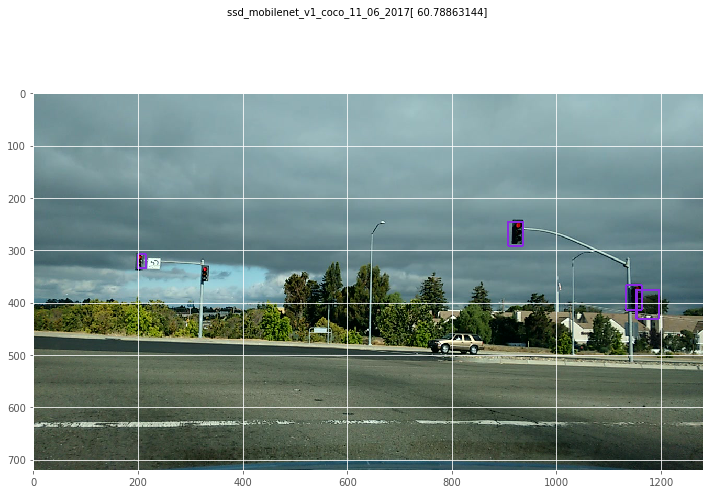

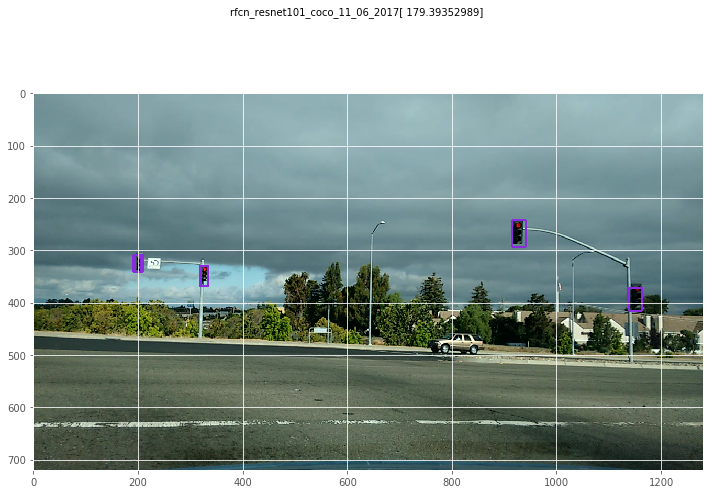

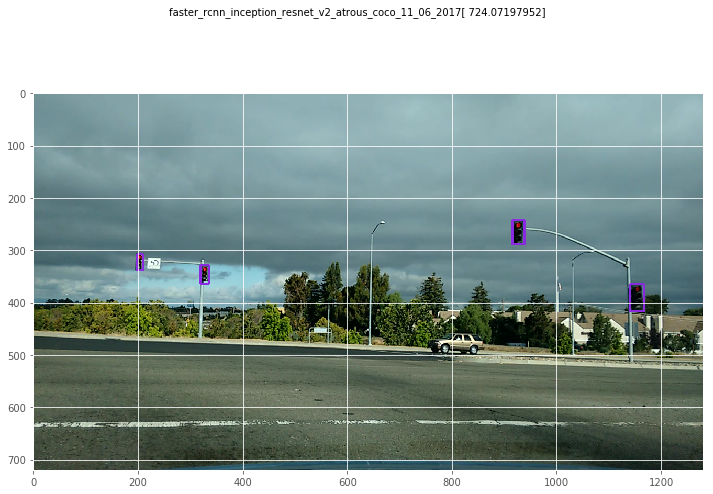

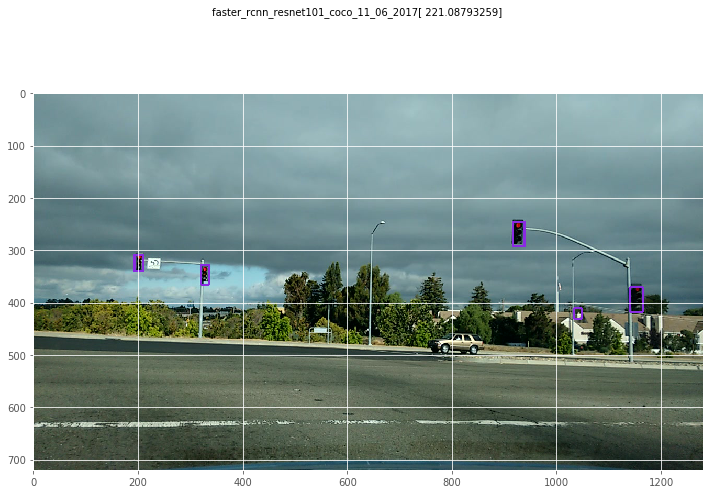

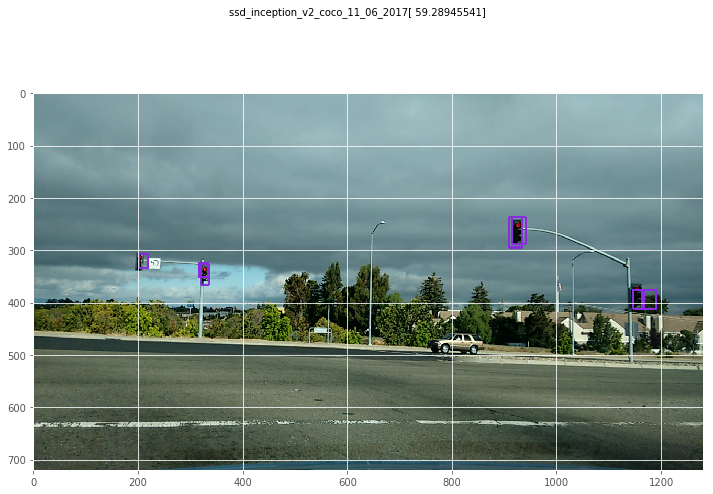

...

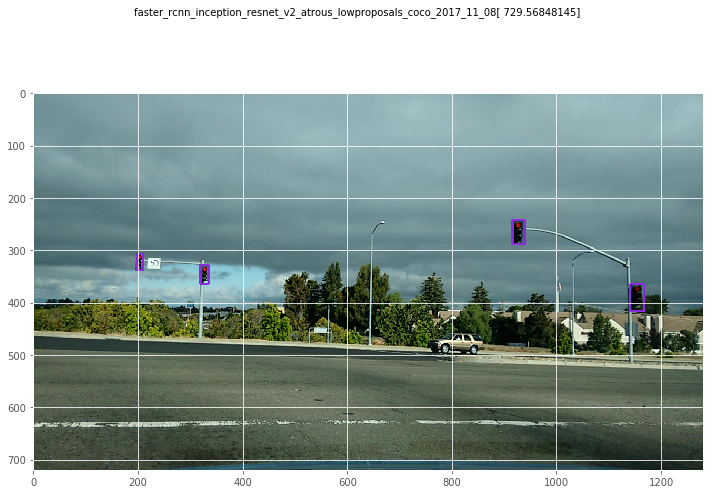

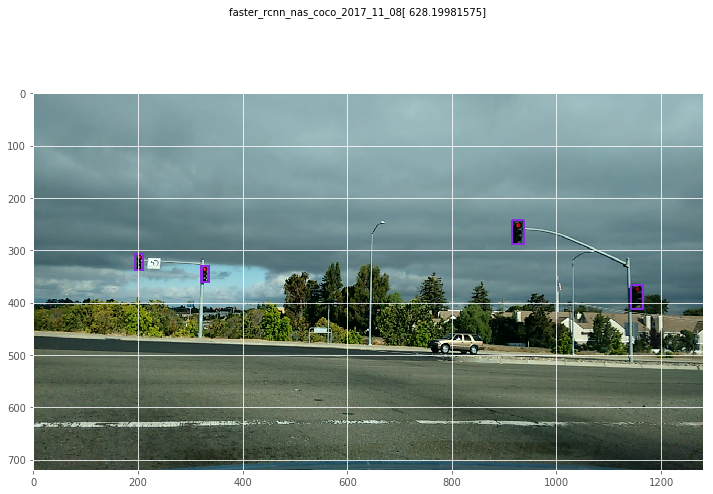

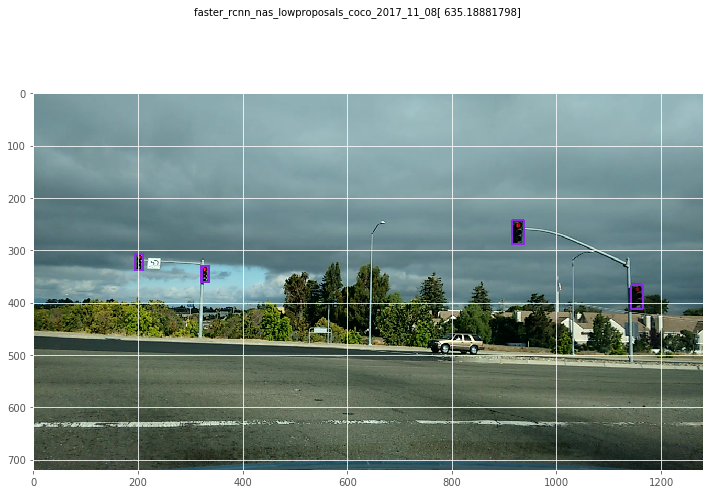

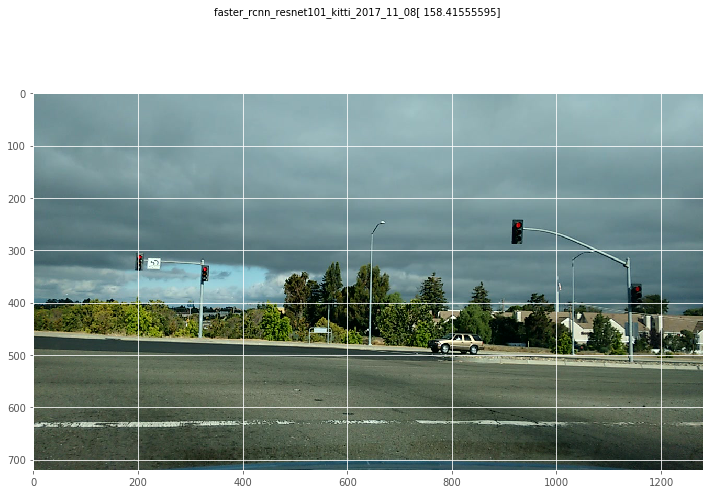

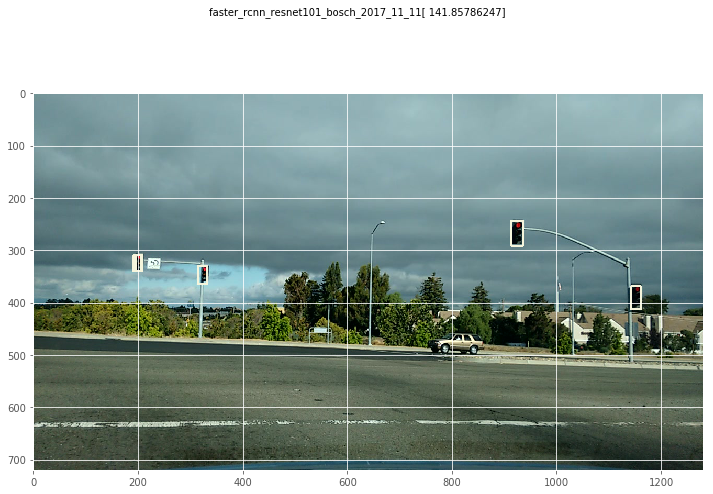

In [42]:
image_paths=[ graph for graph in glob.iglob('test_images_nauto/*')]
test_image=image_paths[12]
confidence_cutoff = 0.2
traffic_lights_class_id=10

times_arr=[]
tick_arr=[]
print("Timing the models...")

for model in frozen_model_paths[0:19]:
    model_name = model.split('/')[5]
    detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(model)
    image = Image.open(test_image)
    image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
    with tf.Session(graph=detection_graph) as sess:                
        boxes,scores,classes,times = detect(sess,
                                  image_tensor,
                                  detection_boxes,
                                  detection_scores,
                                  detection_classes,
                                  image_np,
                                  traffic_sign_class_id)
    if model_name == 'faster_rcnn_resnet101_bosch_2017_11_11':
        boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, scores, classes,range(89))
    else: 
        boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, scores, classes,[traffic_lights_class_id])
    
    ilustrate_detection(image, boxes, classes, model_name + str(times))

    times_arr.append(times)
    tick_arr.append(model_name)
    print("\t", times, model_name)


print("Done timing the models.")    

([<matplotlib.axis.XTick at 0x7fcd7210e320>,
 <a list of 19 Text xticklabel objects>)

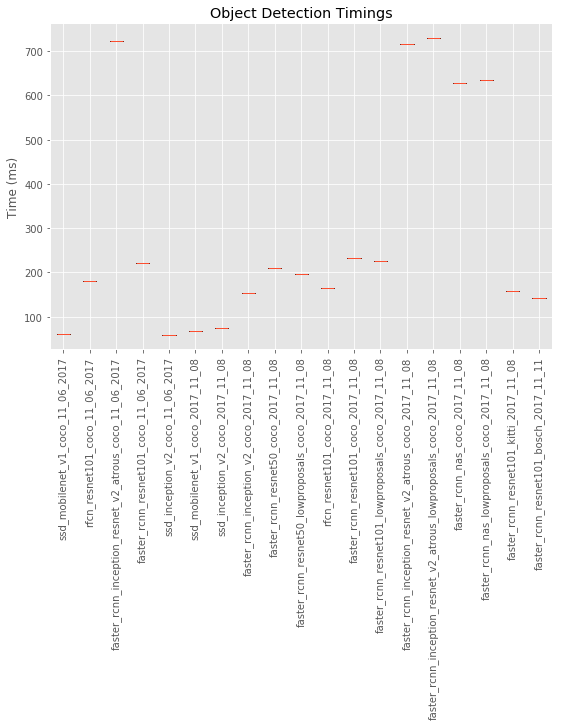

In [43]:
# Create a figure instance
fig = plt.figure(1, figsize=(9, 6))

# Create an axes instance
ax = fig.add_subplot(111)
plt.title("Object Detection Timings")
plt.ylabel("Time (ms)")

# Create the boxplot
plt.style.use('fivethirtyeight')
bp = ax.boxplot(times_arr)
plt.xticks(range(1,len(tick_arr)+1), tick_arr,rotation=90)

## Detecting traffic lights with Inception 

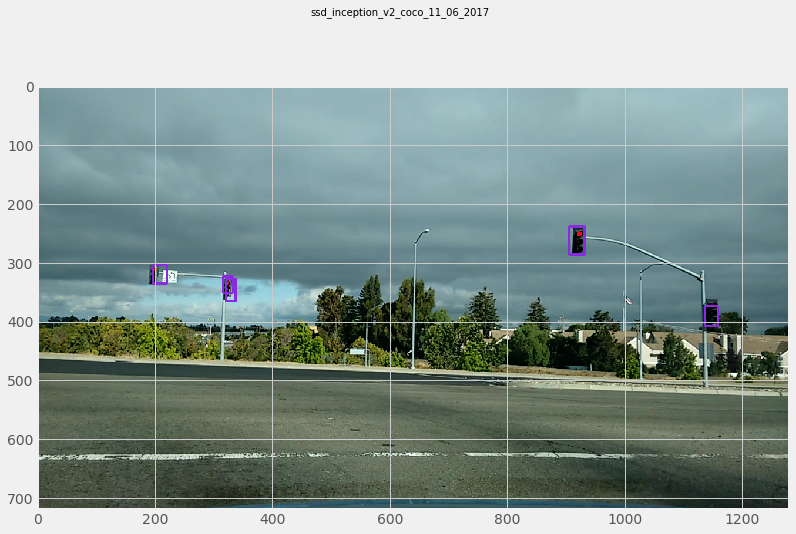

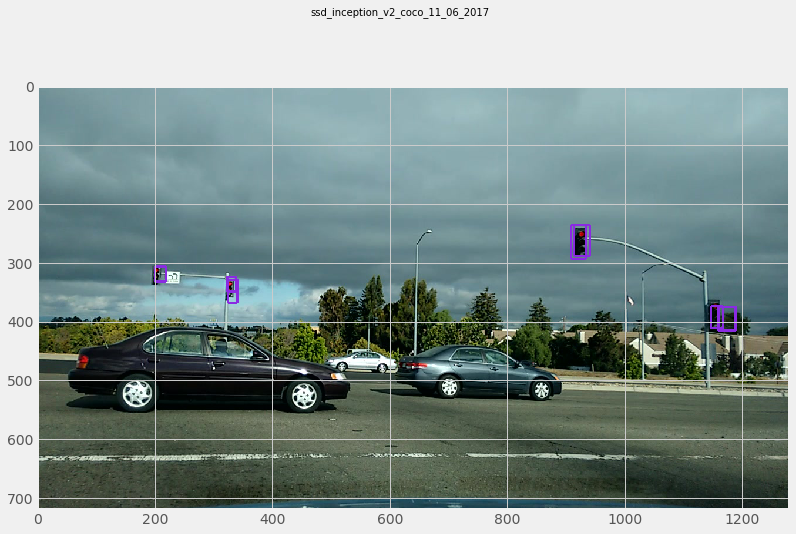

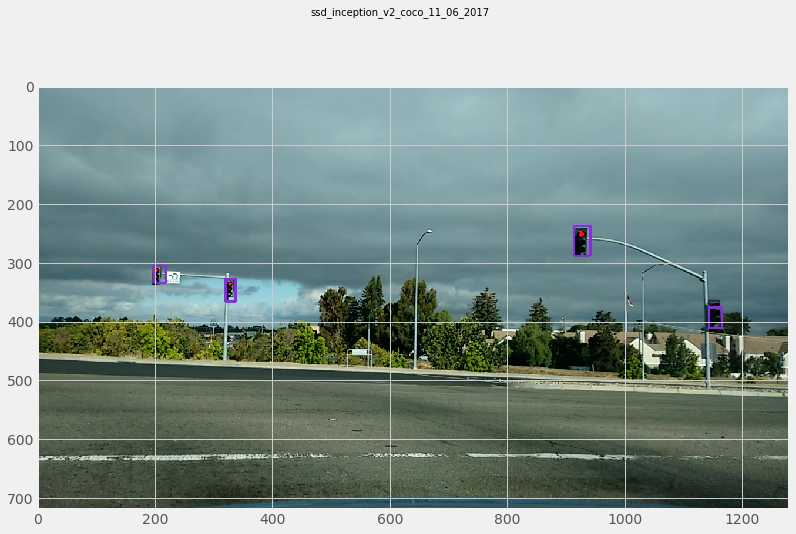

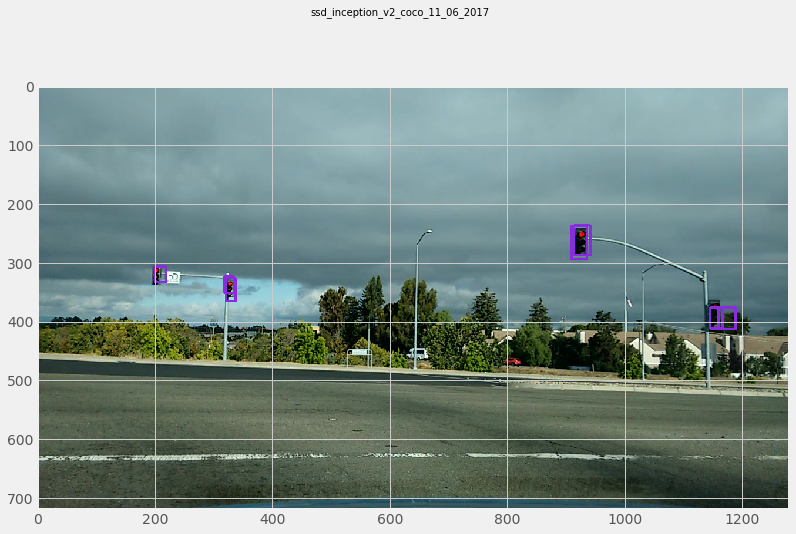

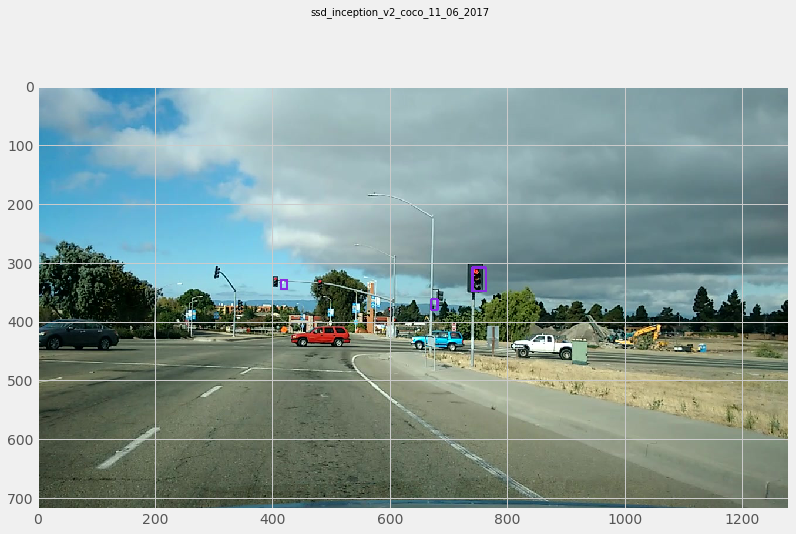

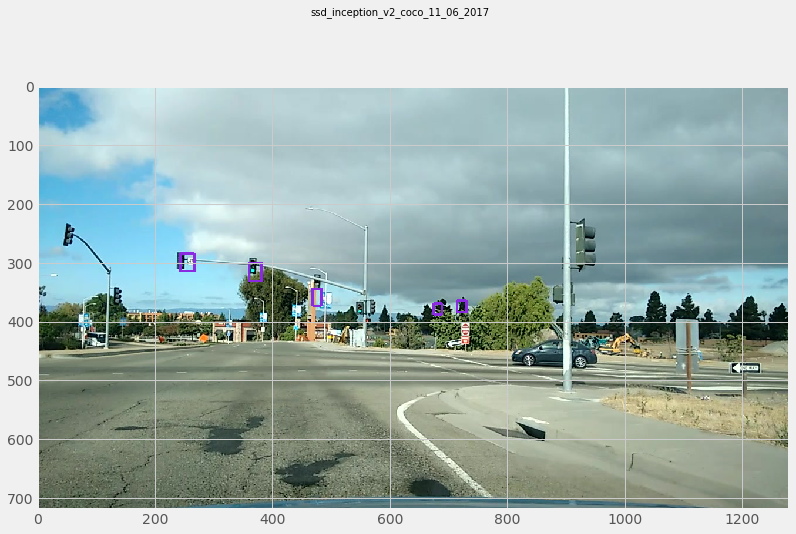

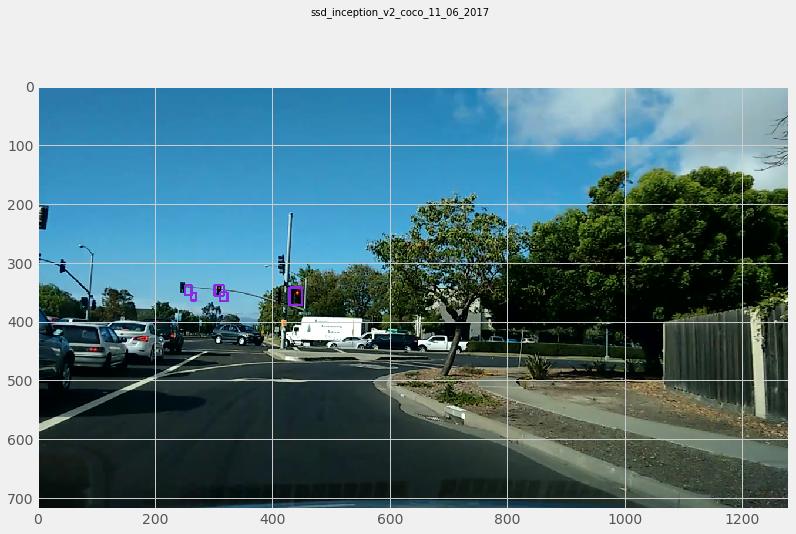

In [52]:
inception=frozen_model_paths[4]
detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(inception)
sess = tf.Session(graph=detection_graph)
for test_image in image_paths[0:200:5]:    
    image = Image.open(test_image)
    image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
    boxes,scores,classes,_ = detect(sess,
                                  image_tensor,
                                  detection_boxes,
                                  detection_scores,
                                  detection_classes,
                                  image_np,
                                  traffic_sign_class_id,0)
    # Filter boxes with a confidence score less than `confidence_cutoff`
    confidence_cutoff = 0.3
    boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, scores, classes,[traffic_lights_class_id])
    ilustrate_detection(image,boxes,classes,inception.split('/')[5])


## Detecting traffic lights with faster_rcnn_resnet101

/data/ab/tl/models/faster_rcnn_resnet101_bosch_2017_11_11/frozen_inference_graph.pb
test_images_nauto/004906.jpg
test_images_nauto/005056.jpg
test_images_nauto/005656.jpg
test_images_nauto/006046.jpg
test_images_nauto/007006.jpg
test_images_nauto/007336.jpg
test_images_nauto/009466.jpg
done


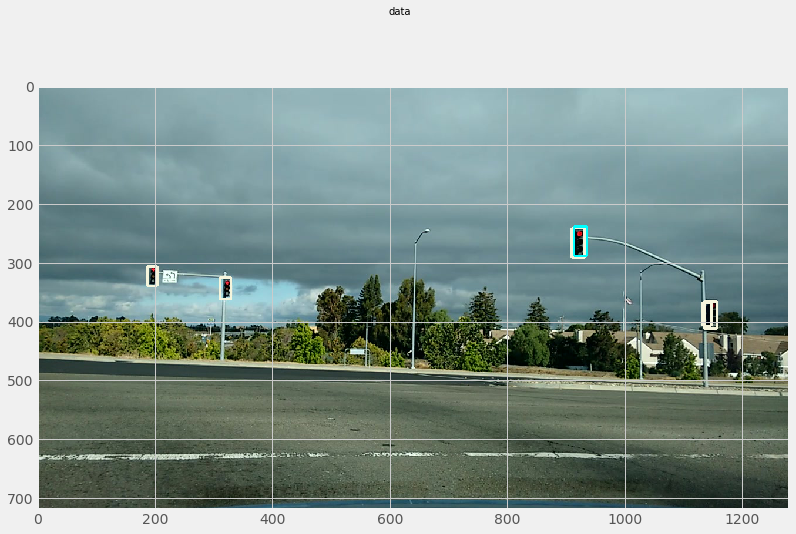

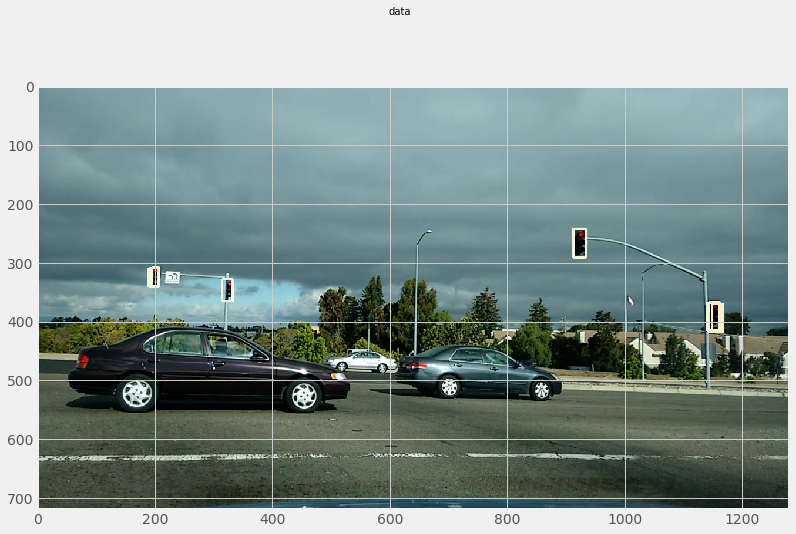

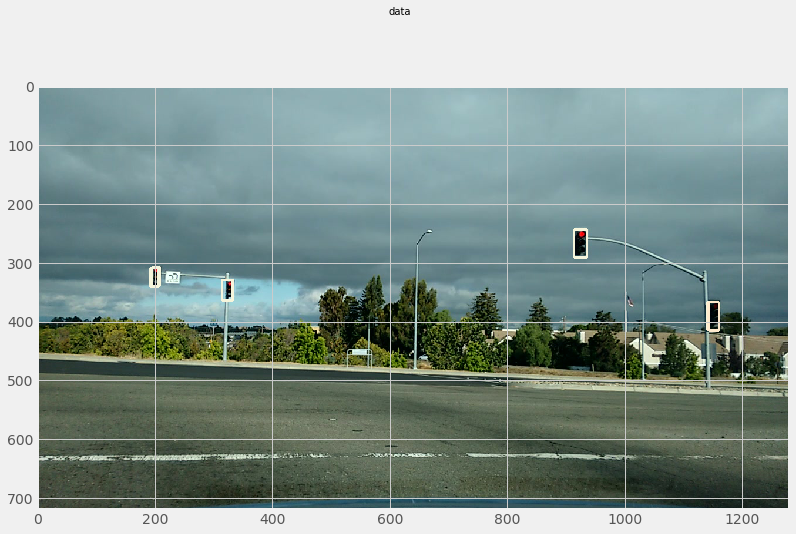

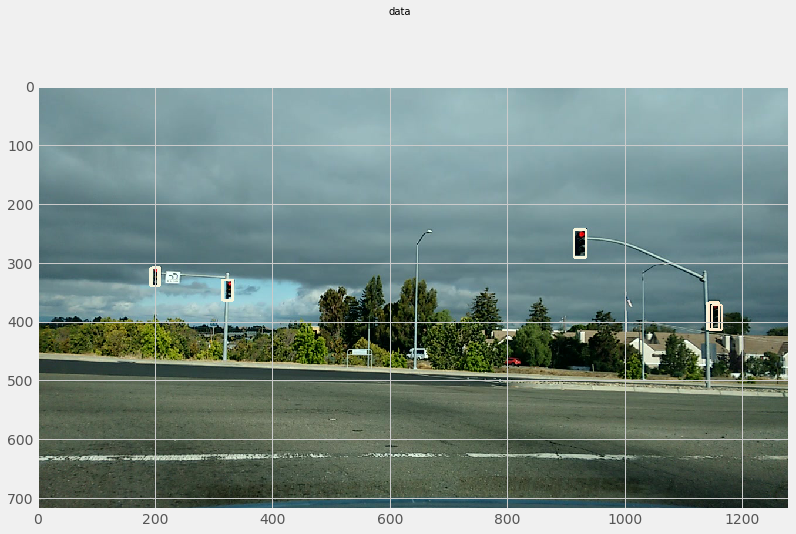

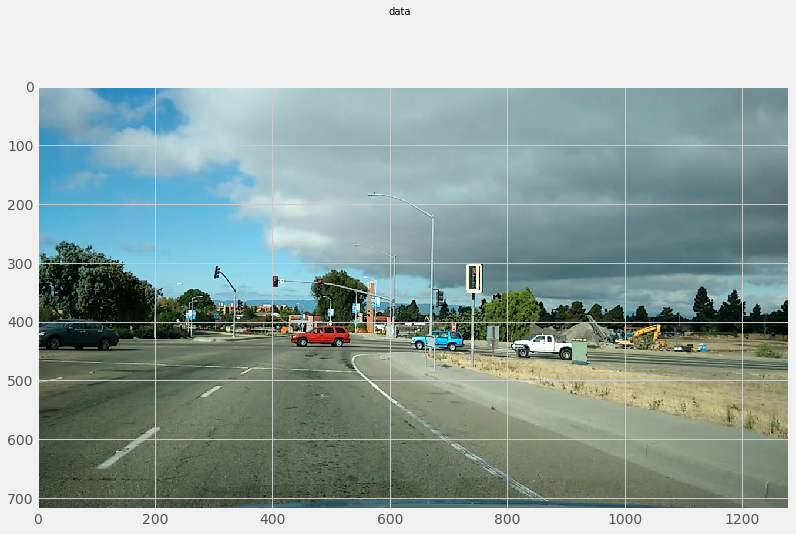

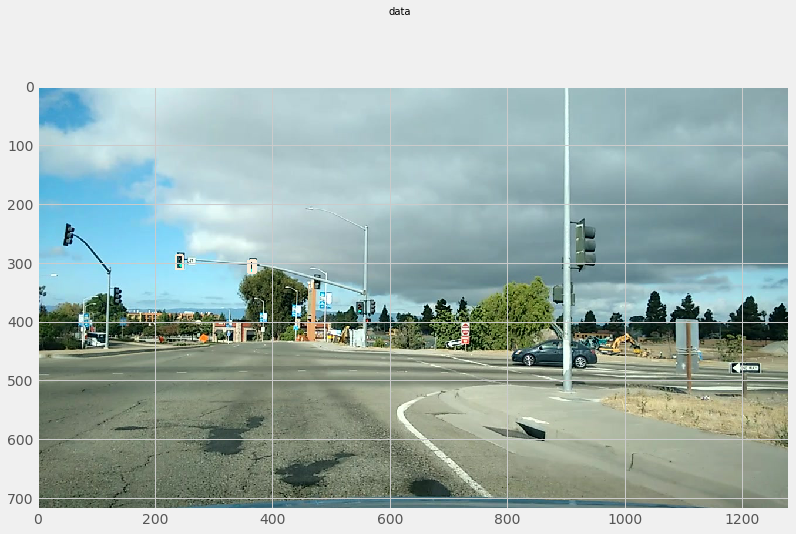

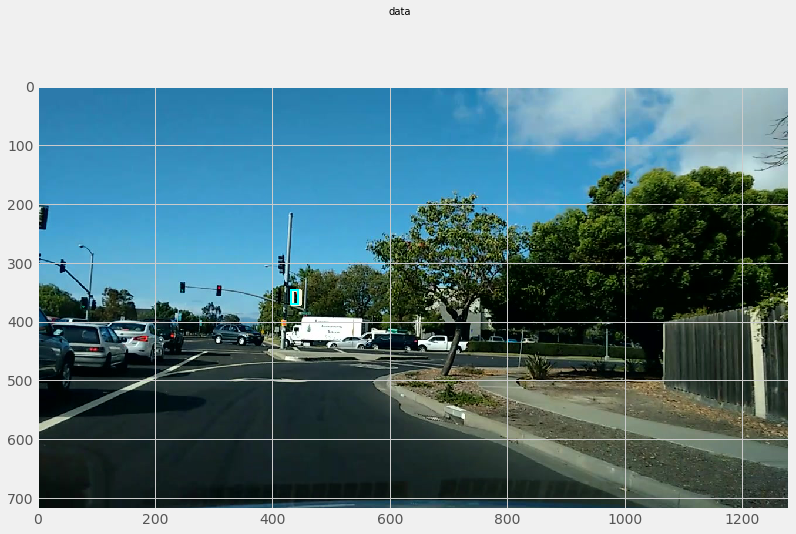

In [56]:
mobilenet=frozen_model_paths[18]
print(mobilenet)
detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(mobilenet)
sess = tf.Session(graph=detection_graph)
for test_image in image_paths[0:200:5]:    
    image = Image.open(test_image)
    image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
    boxes,scores,classes,times = detect(sess,
                                  image_tensor,
                                  detection_boxes,
                                  detection_scores,
                                  detection_classes,
                                  image_np,
                                  1,0)
    #print(scores)
    confidence_cutoff = 0.1
    traffic_lights_class_id=5
    # Filter boxes with a confidence score less than `confidence_cutoff`
    boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, 
                                          scores, classes, range(15))
    #print(times)
    ilustrate_detection(image,boxes,classes,mobilenet.split('/')[1])
    print(test_image)
print("done")    

In [12]:

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)


In [13]:
category_index = {
    1: {'id': 1, 'name': 'Green'}, 
    2: {'id': 2, 'name': 'Red'}, 
    3: {'id': 3, 'name': 'GreenLeft'}, 
    4: {'id': 4, 'name': 'GreenRight'}, 
    5: {'id': 5, 'name': 'RedLeft'}, 
    6: {'id': 6, 'name': 'RedRight'}, 
    7: {'id': 7, 'name': 'Yellow'}, 
    8: {'id': 8, 'name': 'off'}, 
    9: {'id': 9, 'name': 'RedStraight'}, 
    10: {'id': 10, 'name': 'GreenStraight'}, 
    11: {'id': 11, 'name': 'GreenStraightLeft'}, 
    12: {'id': 12, 'name': 'GreenStraightRight'}, 
    13: {'id': 13, 'name': 'RedStraightLeft'}, 
    14: {'id': 14, 'name': 'RedStraightRight'}}

/data/ab/tl/models/faster_rcnn_resnet101_bosch_2017_11_11/frozen_inference_graph.pb


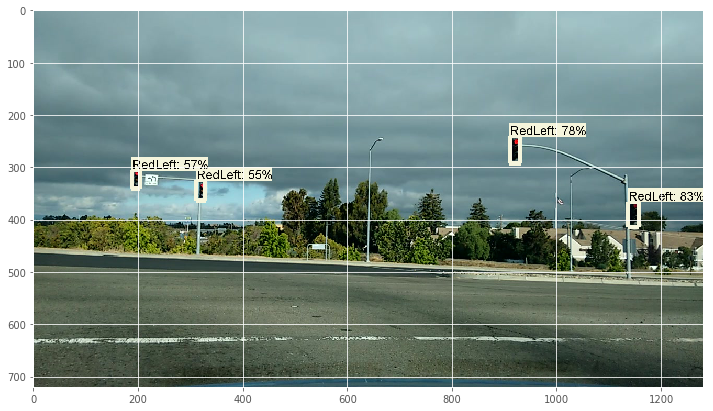

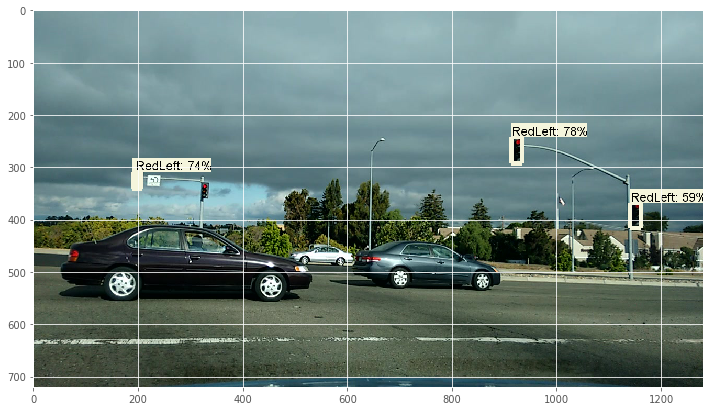

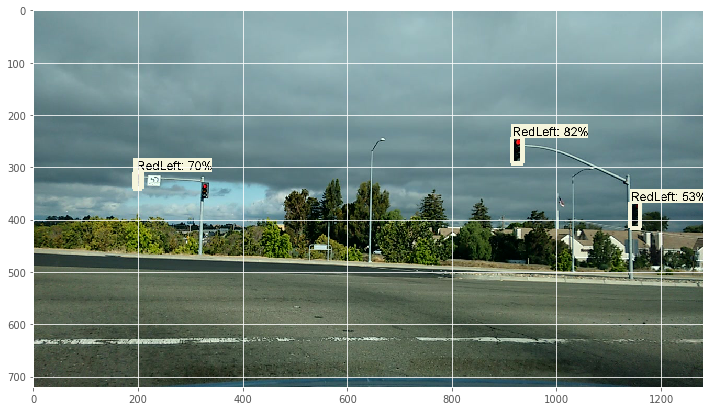

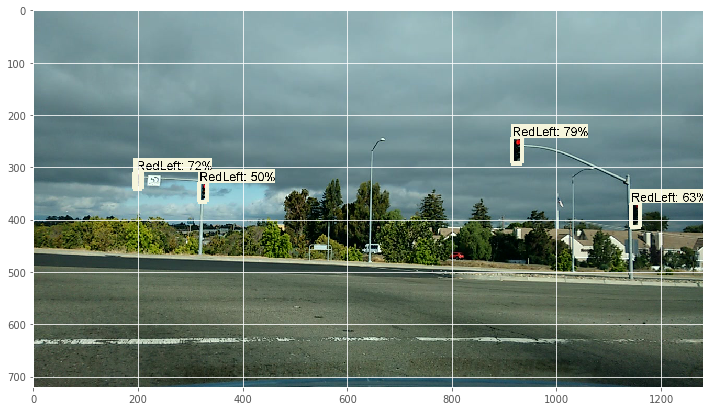

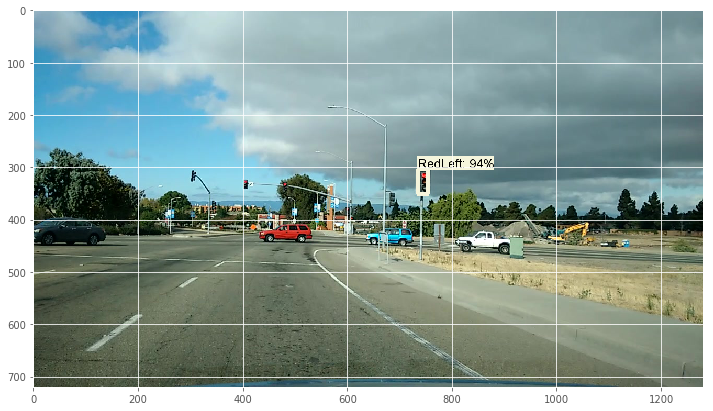

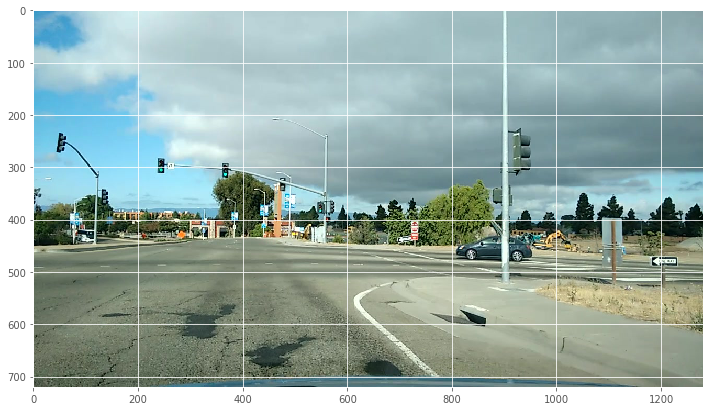

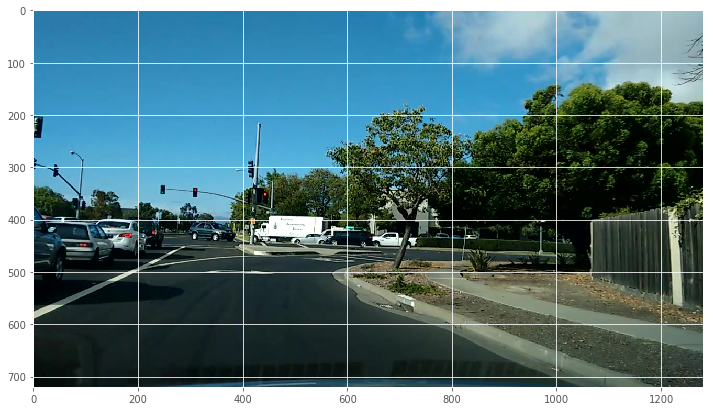

In [14]:
image_paths=[ graph for graph in glob.iglob('test_images_nauto/*')]
mobilenet=frozen_model_paths[18]
print(mobilenet)
detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(mobilenet)
with detection_graph.as_default():
  with tf.Session(graph=detection_graph) as sess:
    # Definite input and output Tensors for detection_graph
    image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
    # Each box represents a part of the image where a particular object was detected.
    detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
    # Each score represent how level of confidence for each of the objects.
    # Score is shown on the result image, together with the class label.
    detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
    detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
    num_detections = detection_graph.get_tensor_by_name('num_detections:0')
    for image_path in image_paths[0:200:5]:
      image = Image.open(image_path)
      # the array based representation of the image will be used later in order to prepare the
      # result image with boxes and labels on it.
      image_np = load_image_into_numpy_array(image)
      # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
      image_np_expanded = np.expand_dims(image_np, axis=0)
      # Actual detection.
      (boxes, scores, classes, num) = sess.run(
          [detection_boxes, detection_scores, detection_classes, num_detections],
          feed_dict={image_tensor: image_np_expanded})
      # Visualization of the results of a detection.
      vis_util.visualize_boxes_and_labels_on_image_array(
          image_np,
          np.squeeze(boxes),
          np.squeeze(classes).astype(np.int32),
          np.squeeze(scores),
          category_index,
          use_normalized_coordinates=True,
          line_thickness=8)
      plt.figure(figsize=IMAGE_SIZE)
      plt.imshow(image_np)